<a href="https://colab.research.google.com/github/kaantopcu/Reverse-Image-Search/blob/main/notebooks/Caltech101.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import requests
import numpy as np
from numpy.linalg import norm
import pickle
import time
from tqdm import tqdm, tqdm_notebook
import torchvision.datasets as datasets
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from keras.models import Model
from keras.layers import GlobalAveragePooling2D
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
from sklearn.decomposition import PCA
import gdown
import shutil
from sklearn.manifold import TSNE

In [2]:
# Define the relative path
relative_path = 'datasets'

# Get the absolute path by joining the current working directory with the relative path
absolute_path = os.path.join(os.getcwd(), relative_path)

# Dataset Download

## Google Colab

In [3]:
!mkdir -p {absolute_path}
!pip install gdown

# Download the dataset
!gdown https://drive.google.com/uc?id=137RyRjvTBkBiIfeYBNZBtViDHQ6_Ewsp --output {absolute_path}/caltech101.tar.gz

# Extract the dataset
!tar -xvzf {absolute_path}/caltech101.tar.gz -C {absolute_path}

# Rename the directory
!mv {absolute_path}/101_ObjectCategories {absolute_path}/caltech101

# Remove unwanted directory
!rm -rf {absolute_path}/caltech101/BACKGROUND_Google

Streaming output truncated to the last 5000 lines.
101_ObjectCategories/chair/image_0005.jpg
101_ObjectCategories/chair/image_0006.jpg
101_ObjectCategories/chair/image_0007.jpg
101_ObjectCategories/chair/image_0008.jpg
101_ObjectCategories/chair/image_0010.jpg
101_ObjectCategories/chair/image_0011.jpg
101_ObjectCategories/chair/image_0012.jpg
101_ObjectCategories/chair/image_0013.jpg
101_ObjectCategories/chair/image_0014.jpg
101_ObjectCategories/chair/image_0016.jpg
101_ObjectCategories/chair/image_0017.jpg
101_ObjectCategories/chair/image_0018.jpg
101_ObjectCategories/chair/image_0019.jpg
101_ObjectCategories/chair/image_0020.jpg
101_ObjectCategories/chair/image_0022.jpg
101_ObjectCategories/chair/image_0023.jpg
101_ObjectCategories/chair/image_0024.jpg
101_ObjectCategories/chair/image_0025.jpg
101_ObjectCategories/chair/image_0026.jpg
101_ObjectCategories/chair/image_0028.jpg
101_ObjectCategories/chair/image_0029.jpg
101_ObjectCategories/chair/image_0030.jpg
101_ObjectCategories/chai

## Amazon Sagemaker Studio Lab

In [ ]:
# Specify the root directory where the dataset will be downloaded
root_dir = "/content/caltech_101"

try:
    # Try to download the Caltech 101 dataset
    caltech101_dataset = datasets.Caltech101(root=root_dir, download=True)
except FileExistsError:
    # If the dataset is already downloaded and verified, don't do anything
    print("Caltech 101 dataset already exists at", root_dir)

'\n\n# Specify the root directory where the dataset will be downloaded\nroot_dir = "/content/caltech_101"\n\ntry:\n    # Try to download the Caltech 101 dataset\n    caltech101_dataset = datasets.Caltech101(root=root_dir, download=True)\nexcept FileExistsError:\n    # If the dataset is already downloaded and verified, don\'t do anything\n    print("Caltech 101 dataset already exists at", root_dir)\n\n'

In [ ]:
# Define the directory to be removed

root_dir = "./caltech_101/caltech101/101_ObjectCategories"

dir_to_remove = os.path.join(root_dir,"BACKGROUND_Google")

# Check if the directory exists before attempting to remove it
if os.path.exists(dir_to_remove):
    # Use shutil.rmtree to remove the directory and its contents recursively
    shutil.rmtree(dir_to_remove)
    print(f"Directory '{dir_to_remove}' and its contents have been successfully removed.")
else:
    print(f"Directory '{dir_to_remove}' does not exist.")

# Feature Extraction

In [4]:
datagen = image.ImageDataGenerator(preprocessing_function=preprocess_input)

root_dir = os.path.join(absolute_path, 'caltech101')

generator = datagen.flow_from_directory(root_dir,
                                        target_size=(224, 224),
                                        class_mode=None,
                                        shuffle=False)

Found 8677 images belonging to 101 classes.


In [5]:
model = ResNet50(weights='imagenet',
                 include_top=False,
                 pooling = "avg",
                 input_shape=(224, 224, 3))

94765736/94765736 [==============================] - 1s 0us/step


In [6]:
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

In [7]:
def extract_features(img_path, model):
    input_shape = (224, 224, 3)
    img = image.load_img(img_path, target_size=(input_shape[0], input_shape[1]))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = preprocess_input(expanded_img_array)
    features = model.predict(preprocessed_img)

    flattened_features = features.flatten()

    normalized_features = flattened_features / norm(flattened_features)

    return normalized_features

In [8]:
sample_image = os.path.join(absolute_path, 'caltech101/Faces/image_0001.jpg')
features = extract_features(sample_image,model)
print(len(features))
features

1/1 [==============================] - 4s 4s/step
2048


array([0.0074265 , 0.00405051, 0.00421501, ..., 0.08466109, 0.01898376,
       0.0337033 ], dtype=float32)

In [9]:
extensions = ['.jpg', '.JPG', '.jpeg', '.JPEG', '.png', '.PNG']

In [10]:
def get_file_list(root_dir):
    file_list = []
    counter = 1
    for root, directories, filenames in os.walk(root_dir):
        for filename in filenames:
            if any(ext in filename for ext in extensions):
                file_list.append(os.path.join(root, filename))
                counter += 1
    return file_list

In [11]:
#root_dir = "./caltech_101"
filenames = sorted(get_file_list(root_dir))
filenames

['/content/datasets/caltech101/Faces/image_0001.jpg',
 '/content/datasets/caltech101/Faces/image_0002.jpg',
 '/content/datasets/caltech101/Faces/image_0003.jpg',
 '/content/datasets/caltech101/Faces/image_0004.jpg',
 '/content/datasets/caltech101/Faces/image_0005.jpg',
 '/content/datasets/caltech101/Faces/image_0006.jpg',
 '/content/datasets/caltech101/Faces/image_0007.jpg',
 '/content/datasets/caltech101/Faces/image_0008.jpg',
 '/content/datasets/caltech101/Faces/image_0009.jpg',
 '/content/datasets/caltech101/Faces/image_0010.jpg',
 '/content/datasets/caltech101/Faces/image_0011.jpg',
 '/content/datasets/caltech101/Faces/image_0012.jpg',
 '/content/datasets/caltech101/Faces/image_0013.jpg',
 '/content/datasets/caltech101/Faces/image_0014.jpg',
 '/content/datasets/caltech101/Faces/image_0015.jpg',
 '/content/datasets/caltech101/Faces/image_0016.jpg',
 '/content/datasets/caltech101/Faces/image_0017.jpg',
 '/content/datasets/caltech101/Faces/image_0018.jpg',
 '/content/datasets/caltech1

In [12]:
feature_list = []
for i in tqdm_notebook(range(len(filenames))):
    feature_list.append(extract_features(filenames[i],model))

<ipython-input-12-6b4c85aae6c7>:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(filenames))):


  0%|          | 0/8677 [00:00<?, ?it/s]

1/1 [==============================] - 0s 240ms/step


KeyboardInterrupt: 

In [ ]:
print("total images:",len(feature_list))
print("features in images:",len(feature_list[0]))

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
pickle.dump(feature_list, open("./features-caltech101-resnet50.pickle",'wb'))
pickle.dump(filenames, open("./filenames-caltech101.pickle",'wb'))
pickle.dump(generator.classes, open('./class_ids-caltech101.pickle','wb'))

In [ ]:
# Push them to drive

# Delete existing files in the destination folder
existing_files = [
    'features-caltech101-resnet50.pickle',
    'filenames-caltech101.pickle',
    'class_ids-caltech101.pickle'
]

destination_folder = "/content/drive/MyDrive/DataProjects/Reverse_Image_Search"

for filename in existing_files:
    file_path = os.path.join(destination_folder, filename)
    if os.path.exists(file_path):
        os.remove(file_path)

# Move files to the destination folder
shutil.move('features-caltech101-resnet50.pickle', destination_folder)
#shutil.move('filenames-caltech101.pickle', destination_folder)
shutil.move('class_ids-caltech101.pickle', destination_folder)

'/content/drive/MyDrive/DataProjects/Reverse_Image_Search/class_ids-caltech101.pickle'

# Similarity Search

In [ ]:
filenames = pickle.load(open("./filenames-caltech101.pickle",'rb'))
feature_list = pickle.load(open("./features-caltech101-resnet50.pickle",'rb'))
class_ids = pickle.load(open("./class_ids-caltech101.pickle",'rb'))

In [ ]:
num_images = len(filenames)
num_features_per_image = len(feature_list[0])
print("Number of images = ", num_images)
print("Number of features per image = ", num_features_per_image)

Number of images =  8677
Number of features per image =  2048


In [ ]:
neighbors = NearestNeighbors(n_neighbors = 5, algorithm = 'brute', metric = 'euclidean').fit(feature_list)

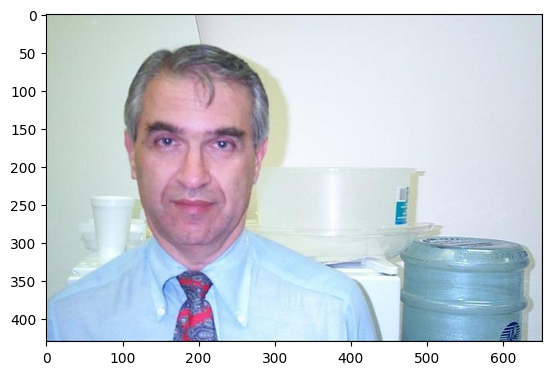

In [ ]:
random_index = 100
distances, indices = neighbors.kneighbors([feature_list[random_index]])
plt.imshow(mpimg.imread(filenames[random_index]), interpolation='lanczos')

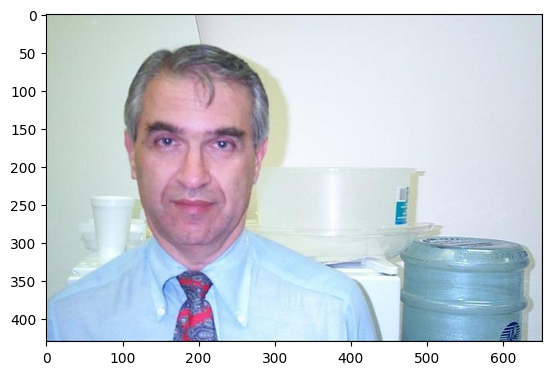

In [ ]:
# Nearest neighbor
plt.imshow(mpimg.imread(filenames[indices[0][0]]), interpolation='lanczos')

In [ ]:
for i in range(5):
    print(distances[0][i])

0.0
0.5798901319503784
0.6251778602600098
0.6315436363220215
0.6366916298866272


Note the distance of the query image to the first closest image is zero, again showing that the closest image to the query image is the same image.

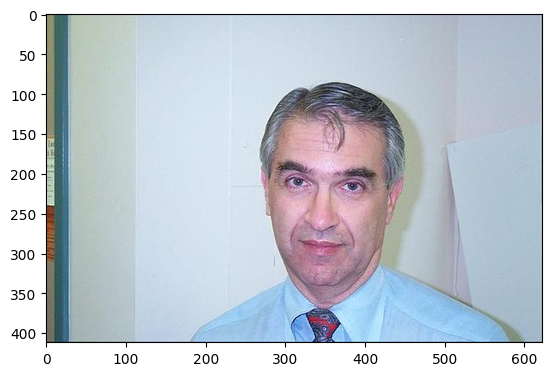

In [ ]:
# Actual nearest neighbor
plt.imshow(mpimg.imread(filenames[indices[0][1]]), interpolation='lanczos')

In [ ]:
# Helper function to get the classname
def classname(str):
    return str.split('/')[-2]


# Helper function to get the classname and filename
def classname_filename(str):
    return str.split('/')[-2] + '/' + str.split('/')[-1]


# Helper functions to plot the nearest images given a query image
def plot_images(filenames, distances):
    images = []
    for filename in filenames:
        images.append(mpimg.imread(filename))
    plt.figure(figsize=(20, 10))
    columns = 4
    num_images = len(filenames)
    columns = 4
    rows = (num_images // columns) + 1  # Cast to integer
    fig = plt.figure(figsize=(15, 10))
    for i, image in enumerate(images):
        ax = plt.subplot(rows, columns, i + 1)
        if i == 0:
            ax.set_title("Query Image\n" + classname_filename(filenames[i]))
        else:
            ax.set_title("Similar Image\n" + classname_filename(filenames[i]) +
                         "\nDistance: " +
                         str(float("{0:.2f}".format(distances[i]))))
        plt.imshow(image)
        # To save the plot in a high definition format i.e. PDF, uncomment the following line:
        #plt.savefig('results/' + str(random.randint(0,10000))+'.pdf', format='pdf', dpi=1000)
        # We will use this line repeatedly in our code.

<Figure size 2000x1000 with 0 Axes>

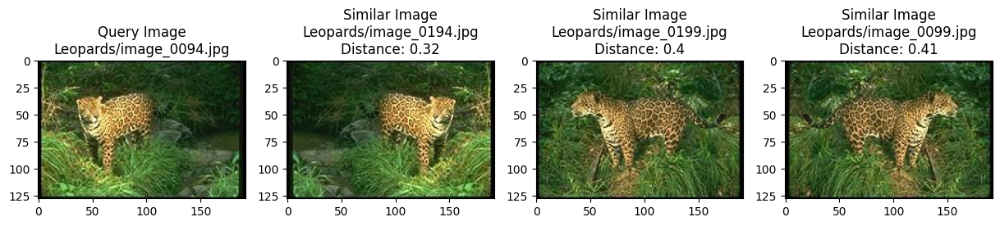

<Figure size 2000x1000 with 0 Axes>

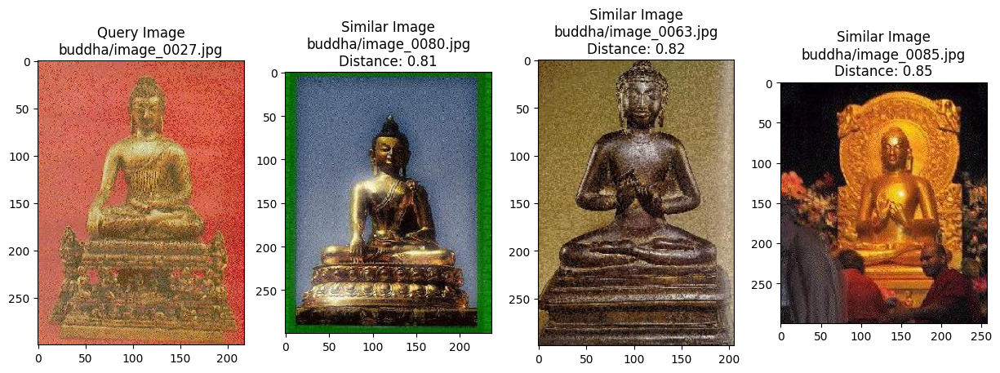

<Figure size 2000x1000 with 0 Axes>

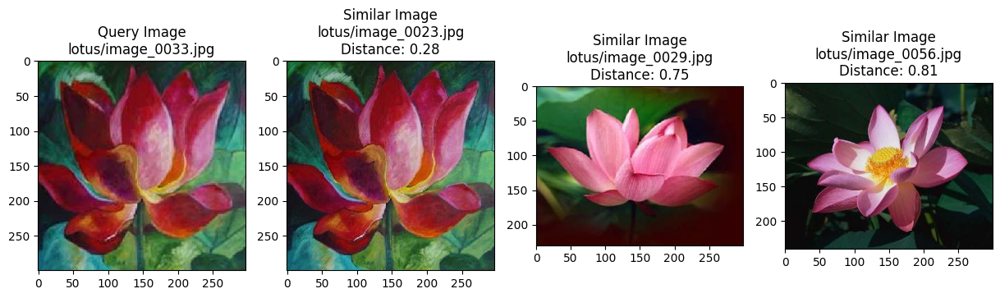

In [ ]:
for i in range(3):
    random_image_index = random.randint(0, num_images)
    distances, indices = neighbors.kneighbors(
        [feature_list[random_image_index]])
    # Don't take the first closest image as it will be the same image
    similar_image_paths = [filenames[random_image_index]] + \
        [filenames[indices[0][i]] for i in range(1, 4)]
    plot_images(similar_image_paths, distances[0])

## Image Clusters with t-SNE

Since we have 2048 feature vector, it is needed to reduce the dimensions. t-distributed stochastic neighbor embedding (t-SNE) reduces high-dimensional feature vector to 2D. But it is difficult to scale large datasets. so firt apply PCA then call t-SNE.

In [ ]:
neighbors = NearestNeighbors(n_neighbors=len(feature_list),
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)
distances, indices = neighbors.kneighbors(feature_list)

# Calculating some stats
print("Median distance between all photos: ", np.median(distances))
print("Max distance between all photos: ", np.max(distances))
print("Median distance among most similar photos: ",
      np.median(distances[:, 2]))

Median distance between all photos:  1.1679046154022217
Max distance between all photos:  1.3594449758529663
Median distance among most similar photos:  0.67351895570755


In [ ]:
selected_features = feature_list[:4000]
selected_class_ids = class_ids[:4000]
selected_filenames = filenames[:4000]

verbose ne,

nearest neighbors'daki brute ne

In [ ]:
# Convert the list to a numpy array
selected_features = np.array(selected_features)
tsne_results = TSNE(n_components = 2, verbose = 1, metric='euclidean').fit_transform(selected_features)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4000 samples in 0.003s...
[t-SNE] Computed neighbors for 4000 samples in 0.900s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4000
[t-SNE] Computed conditional probabilities for sample 2000 / 4000
[t-SNE] Computed conditional probabilities for sample 3000 / 4000
[t-SNE] Computed conditional probabilities for sample 4000 / 4000
[t-SNE] Mean sigma: 0.218704
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.214180
[t-SNE] KL divergence after 1000 iterations: 1.102338


/tmp/ipykernel_489/1660905171.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('coolwarm')


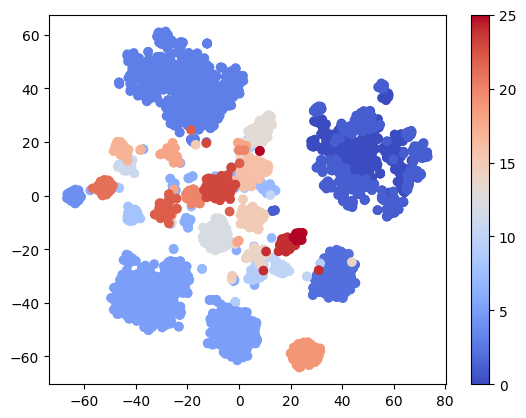

In [ ]:
# Plot a scatter plot from the generated t-SNE results
colormap = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:,0],tsne_results[:,1],c=selected_class_ids,cmap=colormap)
plt.colorbar(scatter_plot)
plt.show()

To visualize images themselves

In [ ]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data
from PIL import Image

def plot_images_in_2d(x, y, image_paths, axis=None, zoom=1):
    if axis is None:
        axis = plt.gca()
    x, y = np.atleast_1d(x, y)
    for x0, y0, image_path in zip(x, y, image_paths):
        image = Image.open(image_path)
        image.thumbnail((100, 100))
        img = OffsetImage(image, zoom=zoom)
        anno_box = AnnotationBbox(img, (x0, y0),
                                  xycoords='data',
                                  frameon=False)
        axis.add_artist(anno_box)
    axis.update_datalim(np.column_stack([x, y]))
    axis.autoscale()

In [ ]:
def show_tsne(x, y, selected_filenames):
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x, y, selected_filenames, zoom=0.3, axis=axis)
    plt.show()

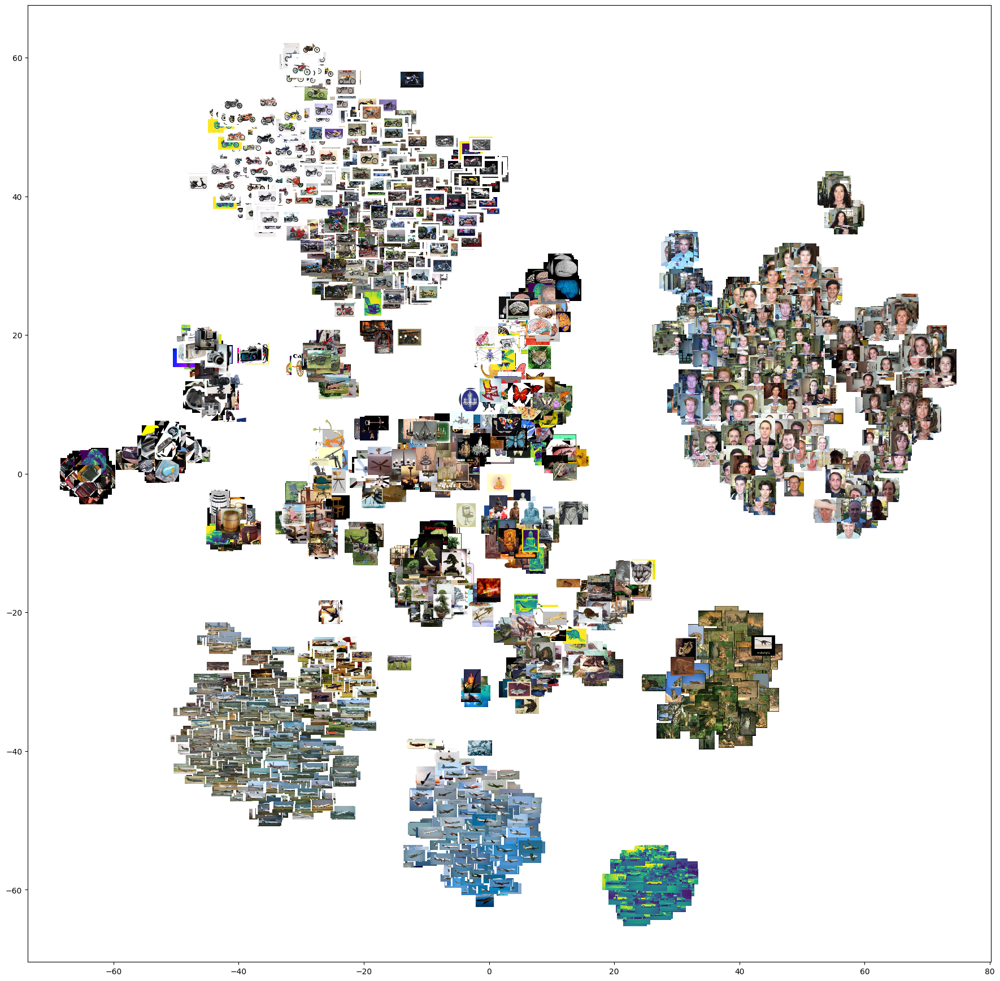

In [ ]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

In [ ]:
def tsne_to_grid_plotter_manual(x, y, selected_filenames):
    S = 2000
    s = 100
    x = (x - min(x)) / (max(x) - min(x))
    y = (y - min(y)) / (max(y) - min(y))
    x_values = []
    y_values = []
    filename_plot = []
    x_y_dict = {}
    for i, image_path in enumerate(selected_filenames):
        a = np.ceil(x[i] * (S - s))
        b = np.ceil(y[i] * (S - s))
        a = int(a - np.mod(a, s))
        b = int(b - np.mod(b, s))
        if str(a) + "|" + str(b) in x_y_dict:
            continue
        x_y_dict[str(a) + "|" + str(b)] = 1
        x_values.append(a)
        y_values.append(b)
        filename_plot.append(image_path)
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x_values, y_values, filename_plot, zoom=.58, axis=axis)
    plt.show()

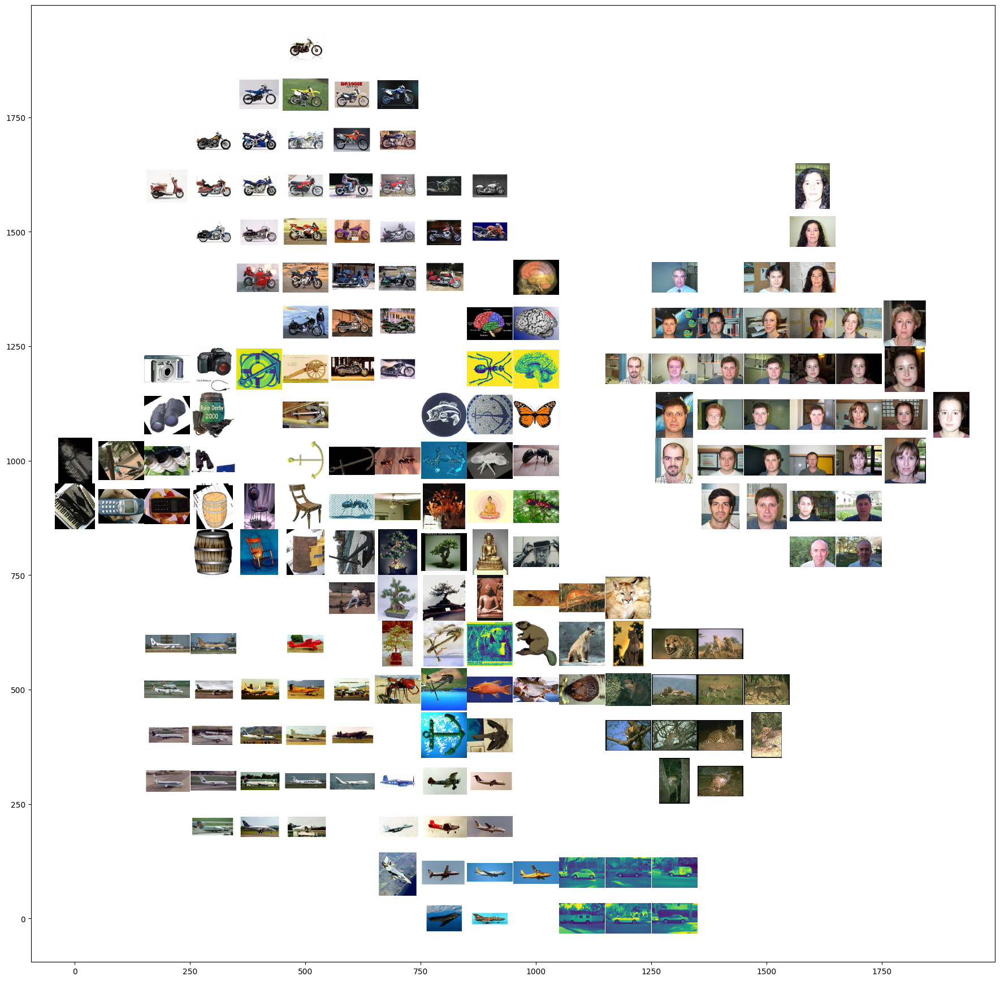

In [ ]:
tsne_to_grid_plotter_manual(tsne_results[:, 0], tsne_results[:, 1],
                            selected_filenames)

## PCA

## PCA Dimension Selection

How to choose the number of pca dimension. It can be explained by the variance vs dimension count

In [ ]:
pca = PCA(200)
pca.fit(feature_list)

In [ ]:
# Explain the importance of first 20 features
print(pca.explained_variance_ratio_[0:20])

[0.07270943 0.05200773 0.04315869 0.03535411 0.02177504 0.02061725
 0.0200197  0.01738707 0.01590189 0.01543361 0.01444921 0.01333165
 0.01225071 0.01142107 0.01101222 0.00995359 0.0096313  0.00920665
 0.00904564 0.00896294]


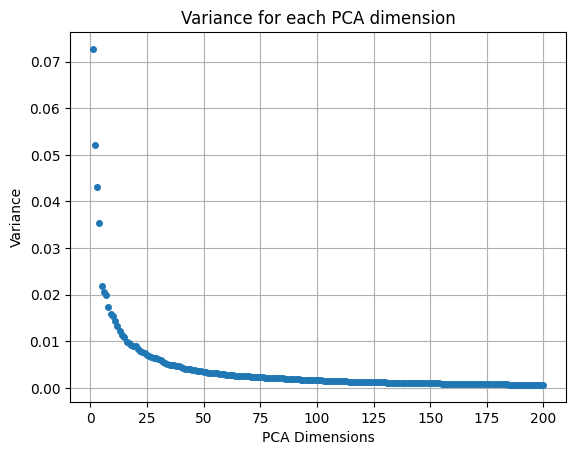

In [ ]:
plt.plot(range(1,201),pca.explained_variance_ratio_, 'o', markersize = 4)
plt.title('Variance for each PCA dimension')
plt.xlabel('PCA Dimensions')
plt.ylabel('Variance')
plt.grid(True)
plt.show()

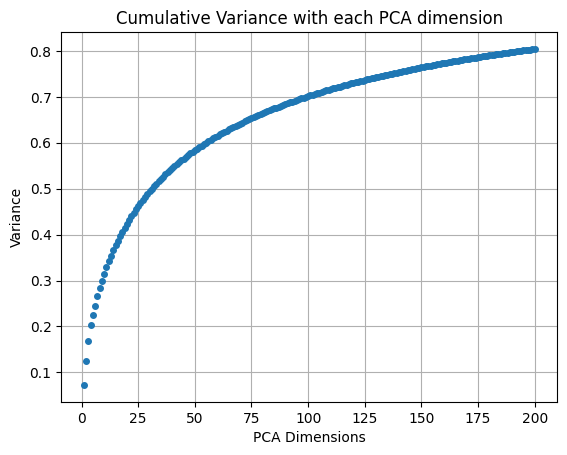

In [ ]:
plt.plot(range(1,201),pca.explained_variance_ratio_.cumsum(), 'o', markersize = 4)
plt.title('Cumulative Variance with each PCA dimension')
plt.xlabel('PCA Dimensions')
plt.ylabel('Variance')
plt.grid(True)
plt.show()

In [ ]:
# Helper function to get the classname
def classname(str):
    return str.split('/')[-2]


# Helper function to get the classname and filename
def classname_filename(str):
    return str.split('/')[-2] + '/' + str.split('/')[-1]


def calculate_accuracy(feature_list):
    num_nearest_neighbors = 5
    correct_predictions = 0
    incorrect_predictions = 0
    neighbors = NearestNeighbors(n_neighbors=num_nearest_neighbors,
                                 algorithm='brute',
                                 metric='euclidean').fit(feature_list)
    for i in tqdm_notebook(range(len(feature_list))):
        distances, indices = neighbors.kneighbors([feature_list[i]])
        for j in range(1, num_nearest_neighbors):
            if (classname(filenames[i]) == classname(
                    filenames[indices[0][j]])):
                correct_predictions += 1
            else:
                incorrect_predictions += 1
    print(
        "Accuracy is ",
        round(
            100.0 * correct_predictions /
            (1.0 * correct_predictions + incorrect_predictions), 2))

In [ ]:
pca_dimensions = [1,2,3,4,5,10,20,50,75,100,150,200]
pca_accuracy = []
pca_time = []

In [ ]:
for dimensions in pca_dimensions:
    pca = PCA(n_components = dimensions)
    pca.fit(feature_list)
    feature_list_compressed = pca.transform(feature_list[:])

    # Calculate the accuracy over the compressed features
    accuracy = calculate_accuracy(feature_list_compressed[:])
    #pca_time.append(time_taken)
    pca_accuracy.append(accuracy)
    print("For PCA Dimensions = ", dimensions, "\tAccuracy = ", accuracy)
    #print("For PCA Dimensions = ", dimensions, "\tAccuracy = ", accuracy, "%", "\tTime = ", pca_time[-1])

/tmp/ipykernel_489/602094626.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(feature_list))):


  0%|          | 0/8677 [00:00<?, ?it/s]

Accuracy is  18.62
For PCA Dimensions =  1 	Accuracy =  None %


/tmp/ipykernel_489/602094626.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(feature_list))):


  0%|          | 0/8677 [00:00<?, ?it/s]

Accuracy is  25.61
For PCA Dimensions =  2 	Accuracy =  None %


/tmp/ipykernel_489/602094626.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(feature_list))):


  0%|          | 0/8677 [00:00<?, ?it/s]

Accuracy is  32.88
For PCA Dimensions =  3 	Accuracy =  None %


/tmp/ipykernel_489/602094626.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(feature_list))):


  0%|          | 0/8677 [00:00<?, ?it/s]

Accuracy is  40.77
For PCA Dimensions =  4 	Accuracy =  None %


/tmp/ipykernel_489/602094626.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(feature_list))):


  0%|          | 0/8677 [00:00<?, ?it/s]

Accuracy is  46.45
For PCA Dimensions =  5 	Accuracy =  None %


/tmp/ipykernel_489/602094626.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(feature_list))):


  0%|          | 0/8677 [00:00<?, ?it/s]

Accuracy is  63.39
For PCA Dimensions =  10 	Accuracy =  None %


/tmp/ipykernel_489/602094626.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(feature_list))):


  0%|          | 0/8677 [00:00<?, ?it/s]

Accuracy is  77.79
For PCA Dimensions =  20 	Accuracy =  None %


/tmp/ipykernel_489/602094626.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(feature_list))):


  0%|          | 0/8677 [00:00<?, ?it/s]

Accuracy is  85.57
For PCA Dimensions =  50 	Accuracy =  None %


/tmp/ipykernel_489/602094626.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(feature_list))):


  0%|          | 0/8677 [00:00<?, ?it/s]

Accuracy is  87.13
For PCA Dimensions =  75 	Accuracy =  None %


/tmp/ipykernel_489/602094626.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(feature_list))):


  0%|          | 0/8677 [00:00<?, ?it/s]

Accuracy is  87.86
For PCA Dimensions =  100 	Accuracy =  None %


/tmp/ipykernel_489/602094626.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(feature_list))):


  0%|          | 0/8677 [00:00<?, ?it/s]

Accuracy is  88.0
For PCA Dimensions =  150 	Accuracy =  None %


/tmp/ipykernel_489/602094626.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(feature_list))):


  0%|          | 0/8677 [00:00<?, ?it/s]

Accuracy is  87.99
For PCA Dimensions =  200 	Accuracy =  None %


## Applying PCA

In [ ]:
# Perform PCA over vectors
num_feature_dimensions = 100
pca = PCA(n_components = num_feature_dimensions)
pca.fit(feature_list)
feature_list_compressed = pca.transform(feature_list)

In [ ]:
feature_list_compressed

array([[ 0.58319443,  0.08211884,  0.15658313, ..., -0.02823912,
        -0.04149488,  0.01064745],
       [ 0.523159  ,  0.13097881,  0.07834338, ...,  0.0252629 ,
        -0.04289011,  0.02095245],
       [ 0.60545086,  0.08158682,  0.1461045 , ..., -0.02215724,
        -0.01022365,  0.04643653],
       ...,
       [-0.02350476,  0.05071301, -0.17987707, ..., -0.04685847,
         0.03297462,  0.07038229],
       [-0.0816406 ,  0.11540757, -0.24241733, ...,  0.01498768,
        -0.00694376, -0.02505881],
       [-0.02106969,  0.09707429, -0.27824722, ..., -0.03709111,
         0.03778409, -0.01917402]])

In [ ]:
print(len(feature_list_compressed))
print(len(feature_list_compressed[0]))

8677
100


In [ ]:
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list_compressed)
distances, indices = neighbors.kneighbors([feature_list_compressed[0]])

<Figure size 2000x1000 with 0 Axes>

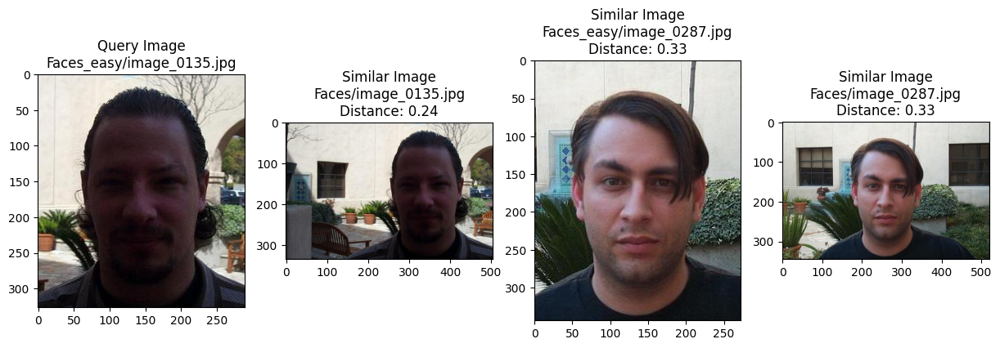

<Figure size 2000x1000 with 0 Axes>

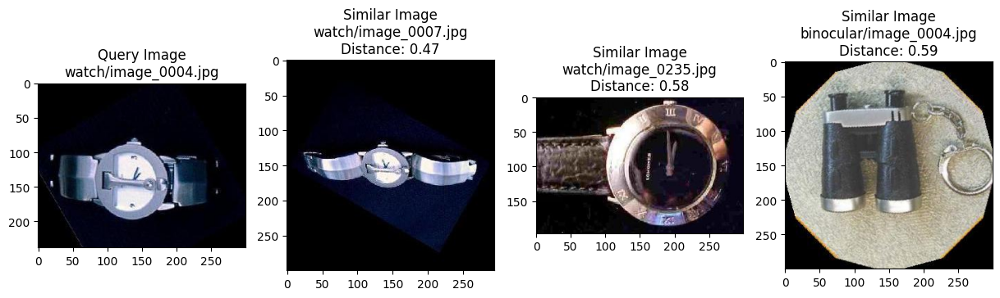

<Figure size 2000x1000 with 0 Axes>

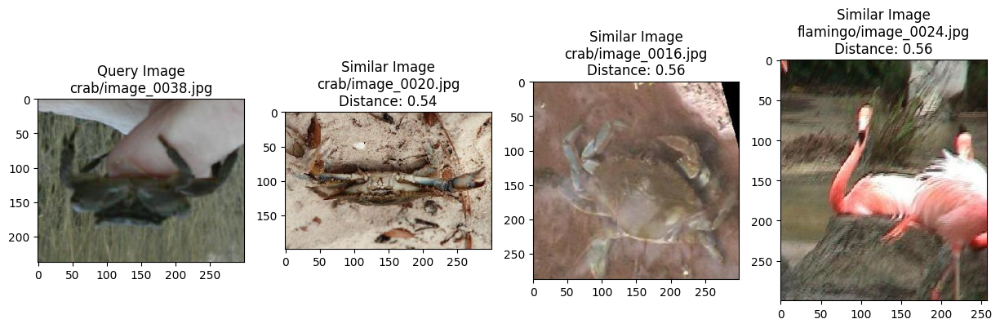

In [ ]:
for i in range(3):
    random_image_index = random.randint(0, num_images)
    distances, indices = neighbors.kneighbors(
        [feature_list_compressed[random_image_index]])
    # Don't take the first closest image as it will be the same image
    similar_image_paths = [filenames[random_image_index]] + \
        [filenames[indices[0][i]] for i in range(1, 4)]
    plot_images(similar_image_paths, distances[0])

In [ ]:
selected_features = feature_list_compressed[:4000]
selected_class_ids = class_ids[:4000]
selected_filenames = filenames[:4000]

In [ ]:
# Convert the list to a numpy array
selected_features = np.array(selected_features)
tsne_results = TSNE(n_components = 2, verbose = 1, metric='euclidean').fit_transform(selected_features)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4000 samples in 0.001s...
[t-SNE] Computed neighbors for 4000 samples in 0.163s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4000
[t-SNE] Computed conditional probabilities for sample 2000 / 4000
[t-SNE] Computed conditional probabilities for sample 3000 / 4000
[t-SNE] Computed conditional probabilities for sample 4000 / 4000
[t-SNE] Mean sigma: 0.164319
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.862251
[t-SNE] KL divergence after 1000 iterations: 1.019168


/tmp/ipykernel_489/1660905171.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('coolwarm')


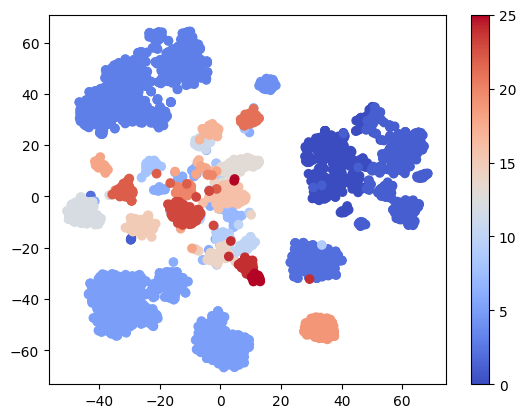

In [ ]:
# Plot a scatter plot from the generated t-SNE results
colormap = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:,0],tsne_results[:,1],c=selected_class_ids,cmap=colormap)
plt.colorbar(scatter_plot)
plt.show()

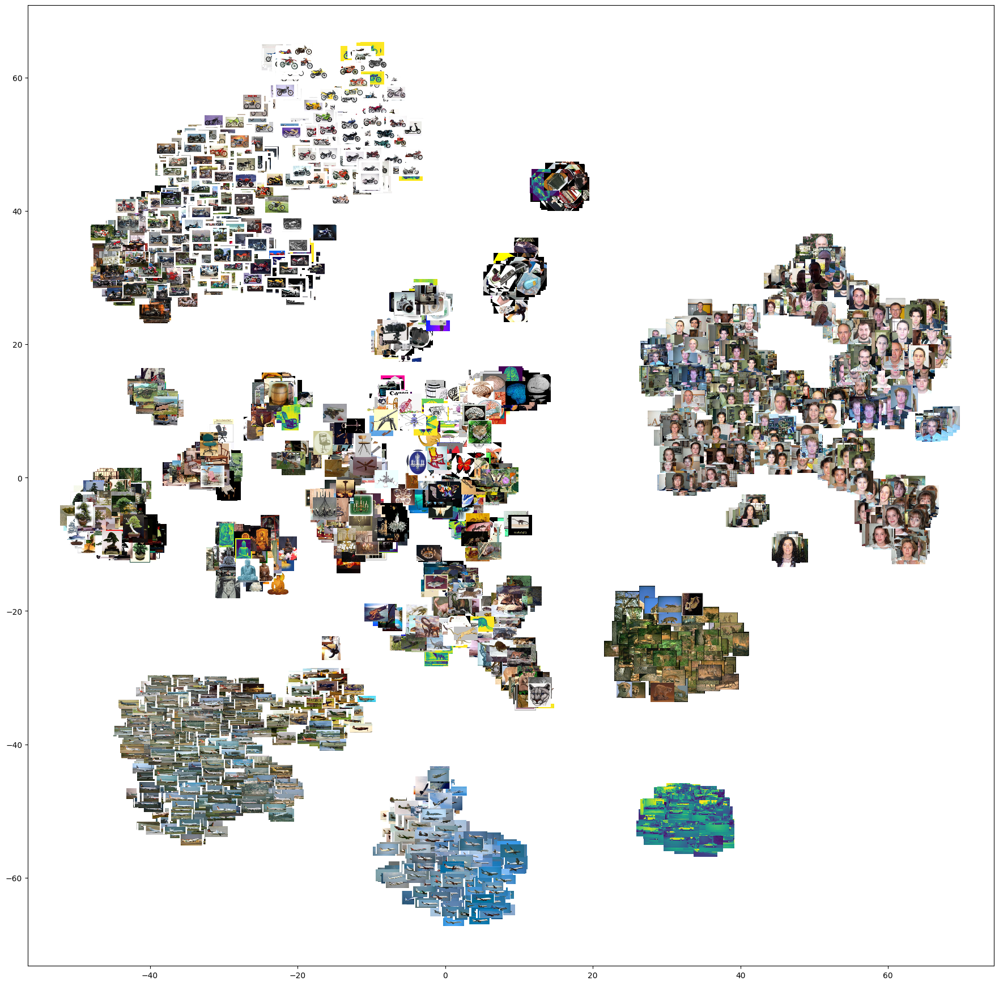

In [ ]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

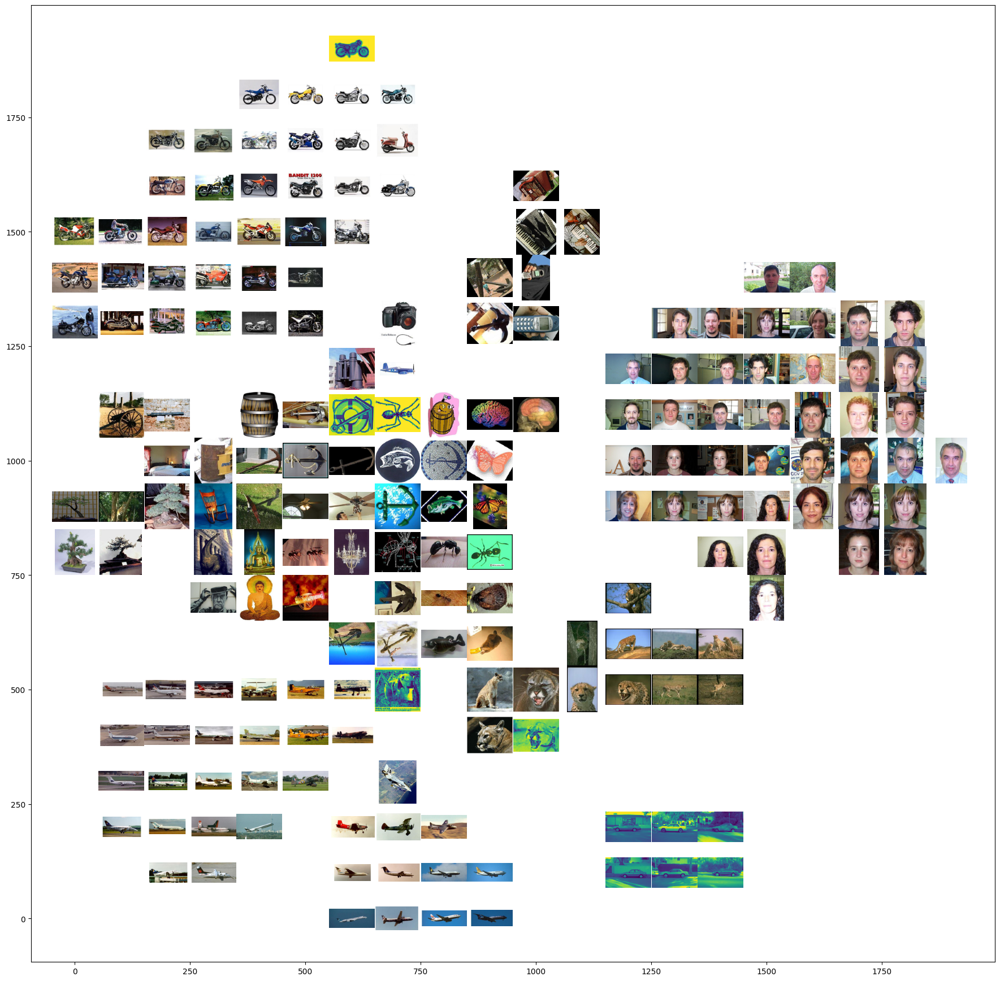

In [ ]:
tsne_to_grid_plotter_manual(tsne_results[:, 0], tsne_results[:, 1],
                            selected_filenames)